<a href="https://colab.research.google.com/github/07rv/Dog-breed/blob/main/Dogbreed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-End Multi-class  Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using **TensorFlow** and **TensorFlow Hub**

# 1. Problem
Identifying the breed of a dog given an image of a dog

# 2. Data
The data we're using is from kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

# 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

# 4.  Features
We're dealing with images (unstructured data) so it's probably best we use deep learning/ transfer learning.<br/>
* There are 120 breeds of dogs (120 different classes).
* There are around 10,000+ images in the training set (with labels) and 10,000+ images in the test set (without labels).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
## unzip the uploaded data into Google Drive
## !unzip "drive/MyDrive/Colab/dog-breed-identification.zip" -d "drive/MyDrive/Colab"

### Get our workspace ready
* import TensorFlow
* import TenosrFlow Hub
* Make sure we're using a GPU

In [ ]:
## import 
import tensorflow as tf  
import tensorflow_hub as hub
print("TF Version: ",tf.__version__)
print("TF Hub Version: ",hub.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

TF Version:  2.3.0
TF Hub Version:  0.10.0
GPU available


## Getting our data ready 
With all machine learnig models, our data has to be in numerial format. So that's what we'll doing first. Turning out images into Tensors (numerical representation)

In [ ]:
# Checking the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Colab/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     3ba209acedcab97fcece8095c54c11f6  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
brabancon_griffon        67
komondor                 67
golden_retriever         67
briard                   66
eskimo_dog               66
Name: breed, Length: 120, dtype: int64

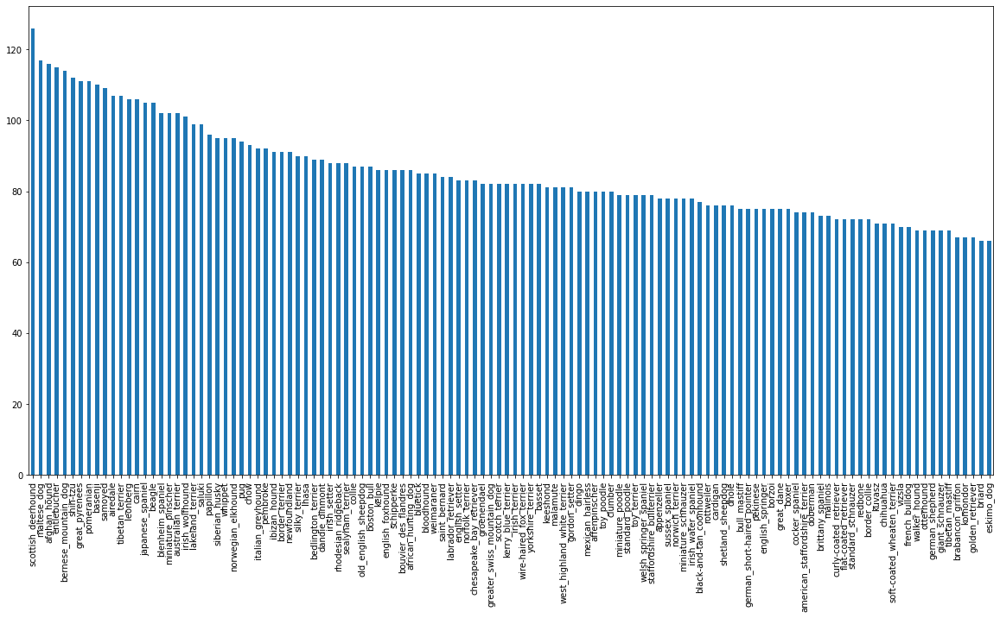

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:

labels_csv["breed"].value_counts().median()

82.0

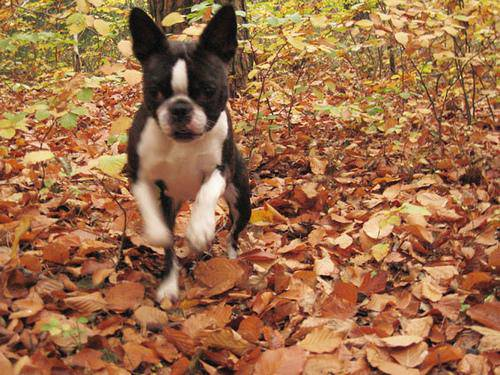

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Colab/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels
Let's get a list of all out image file pathnames

In [ ]:
# Create pathnames from images ID's
filenames = ["drive/My Drive/Colab/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/My Drive/Colab/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Colab/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Colab/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Colab/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Colab/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Colab/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Colab/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Colab/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Colab/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir("drive/My Drive/Colab/train/"))== len(filenames):
  print("Filenames matches actual amount of files")
else:
  print("Filenames do not matches actual amount of files")

Filenames matches actual amount of files


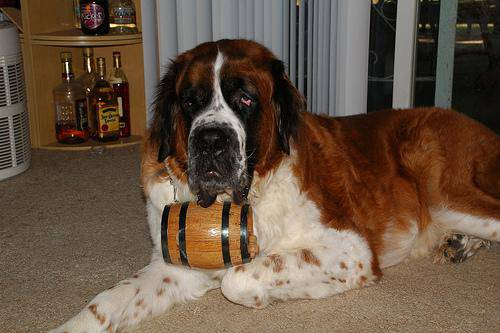

In [ ]:
Image(filenames[2800])

In [ ]:
labels_csv["breed"][2800]

'saint_bernard'

Since we've now got our training image filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels doen not match number of filenames")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
print(unique_breeds)
print("Unique Breeds ",len(unique_breeds))

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs
print(boolean_labels[0].astype(int)) # there will be 1 where the samples label occurrs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating validation sets

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed,

In [ ]:
# Set number of image to use for experimenting
NUM_iMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000 }

In [ ]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_iMAGES],
                                                  y[:NUM_iMAGES],
                                                  test_size=0.2,
                                                  random_state =42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2],y_train[:2]

(['drive/My Drive/Colab/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Colab/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, Fals

Perprocessing Images (turning images into Tensors)
To preprocess our image into Tenosrs we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn your `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 and 0-1).
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`
<br/>
**Function**

In [ ]:
# Define image size
IMG_SIZE = 224

# fun
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image  = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (RBG)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 and 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,244)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches

If we process 10,000+ images in one go, they all might not fit into memory<br/>
So that's why we do about 32 (batch size) images at a time.<br/>
In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:<br/>
`(image,label)`


In [ ]:
# Create a function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a type of (image,label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above function
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048


**function**
<br/>
To convert all our data into tuples of tensors in the form :`(image,label)`



In [ ]:
# define the size batech size, 32 is a good start
BATCH_SIZE = 32

# fun
def create_data_batches(X,y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image(X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print("creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),     #filepath
                                                tf.constant(y)))    #label
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches..")
    # Turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),     #filepath
                                                tf.constant(y)))    #label
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffle
    data = data.shuffle(buffer_size=len(X))
    
    # Create (image,label) tuples (also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch 





In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches..
Creating validation data batches..


In [ ]:
# Check out the different attributes of our Data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Display a plot of 25 images and their labels from a data batch.
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (displaying images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the images label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

#### Training Set
**Visualize**

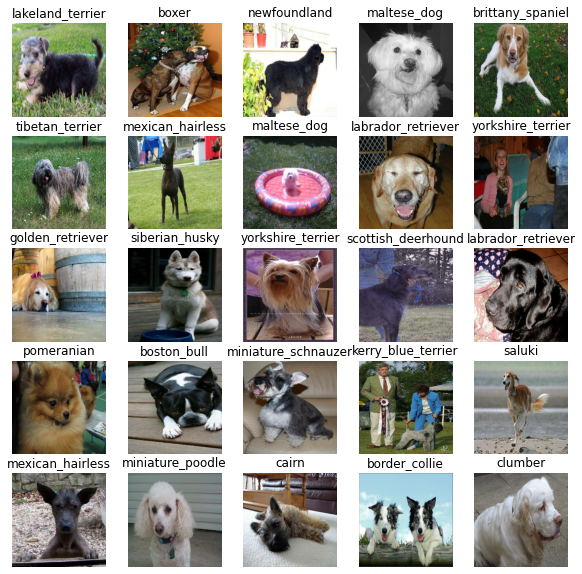

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

#### Validation Set
**Visualize**

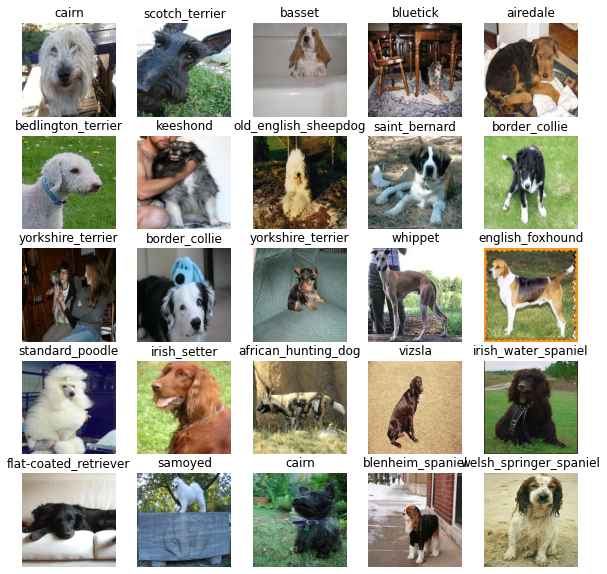

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
* The inputs shape (our images shape, in the form of Tensors) to our model.
* The Output shape (image labels, in the form of Tensors) to our model.
* The URl of the model we want to use from TensorFlow Hub -
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE =[None, IMG_SIZE, IMG_SIZE,3] # batch,height,width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

**Function**<br/>
Keras deep learning model
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a keras model model in sequrntial fashion.
* Complies the model (evaluated and improved)
* Building the model
* Return the model.

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])
 
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

####TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension  
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. 
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard



####Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

**TensorBoard Callback**

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Colab/logs",
                        # make it so the logs get traced whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

**Early Stopping Callback**

In [ ]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

####Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS =100 #@param {type:"slider",min:10, max:100, step:10}

Function to trains a model.
* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model


In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  #create a model
  model = create_model()

  #create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #fit the model to the data passing it the callback created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  #return fitted model
  return model


In [ ]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.9835 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 183s 7s/step - loss: 4.4726 - accuracy: 0.1075 - val_loss: 3.4834 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 4s 170ms/step - loss: 1.5573 - accuracy: 0.7188 - val_loss: 2.2376 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 4s 168ms/step - loss: 0.5320 - accuracy: 0.9525 - val_loss: 1.7270 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 4s 168ms/step - loss: 0.2379 - accuracy: 0.9912 - val_loss: 1.5558 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 168ms/step - loss: 0.1398 - accuracy: 0.9937 - val_loss: 1.4805 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 4s 169ms/step - loss: 0.0958 - accuracy: 1.0000 - val_loss: 1.4228 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - 4s 170ms/step - loss: 0.0721 - accuracy: 1.0000 - val_loss: 1.4019 - val_accuracy: 0.6400
Epoch 8/100



**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will acces the logs directiry we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\Drive/Colab/logs

<IPython.core.display.Javascript object>

## Making and evaluting predictions using a triained model

In [ ]:
# Predictions on validayion data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 112ms/step


array([[1.6420417e-03, 2.7940326e-04, 2.7105215e-03, ..., 7.4596878e-04,
        4.8755875e-05, 8.2985600e-03],
       [2.0188405e-03, 3.2892218e-04, 6.4169448e-03, ..., 1.2362369e-04,
        1.2681843e-03, 1.6605998e-04],
       [5.1312643e-05, 1.6062483e-04, 2.6514777e-04, ..., 1.2616126e-04,
        5.3592976e-05, 1.2152729e-03],
       ...,
       [9.0479834e-06, 2.9244067e-05, 9.8656092e-05, ..., 7.6807028e-06,
        4.5873964e-04, 2.3087070e-04],
       [5.4181009e-03, 2.9161121e-04, 3.0885145e-04, ..., 8.1811030e-04,
        3.6420879e-05, 3.1470235e-02],
       [1.0473767e-04, 2.5531455e-05, 9.6678064e-04, ..., 7.8306207e-04,
        1.3345460e-04, 2.5596793e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# First predictions
index = 0 
print(predictions[index])
print(f"max value (probability of prediction:{np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"max index:{np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.64204172e-03 2.79403263e-04 2.71052145e-03 7.78243266e-05
 3.72866663e-04 1.15497405e-05 6.92038750e-03 2.49987422e-03
 1.96259483e-04 1.30450109e-03 1.74922738e-04 1.60753363e-04
 2.14098880e-04 1.21213452e-04 2.06024357e-04 9.59862315e-04
 2.04532596e-04 8.46206397e-02 6.67013956e-05 5.25788382e-05
 2.63418333e-04 1.29703071e-03 2.23798288e-05 6.32575830e-05
 5.52146696e-04 6.56015007e-04 3.60215068e-01 1.37415470e-03
 2.24497425e-03 1.59980939e-03 5.93263889e-04 2.77646846e-04
 8.65110254e-04 1.11955560e-05 2.51071870e-05 4.39941175e-02
 6.18015911e-05 2.07810104e-03 2.59861845e-04 3.93349357e-04
 5.73071702e-05 2.40652080e-05 1.47814886e-03 2.83277826e-04
 1.55924408e-05 3.59065540e-04 5.78975378e-05 4.62335629e-05
 1.73751352e-04 1.08747568e-03 4.25244943e-04 3.80738711e-05
 2.06664699e-04 1.40013013e-04 2.50564190e-03 3.42449421e-05
 8.58355430e-04 5.90906420e-04 2.45543750e-04 9.19151530e-02
 3.27120943e-04 1.25253189e-03 3.43538355e-03 3.54725780e-05
 6.80941681e-04 1.320398

In [ ]:
unique_breeds[17]

'border_terrier'

**function**

In [ ]:
# turn prediction probabilty into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of predictions probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


Now since our validation data isstill in a batch dataset, we'll have to unbatchify  it to make predictions
 on the validation images then comapare those predictions to the validation label(truth label)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels


In [ ]:
val_images, val_labels = unbatchify(val_data)

val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. 
* Convert the prediction probabilities to a predicted label. 
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. 

**function**


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


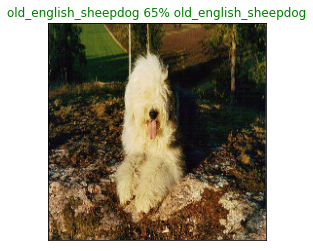

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=7)


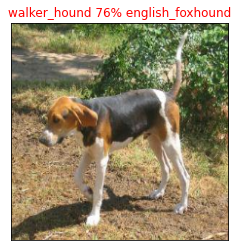

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer 
* Find the prediction using get_pred_label() 
* Find the top 10:
* Prediction probabilities indexes 
* Prediction probabilities values
* Prediction labels 
* Plot the top 10 prediction probability values and labels, coloring the true label green 

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

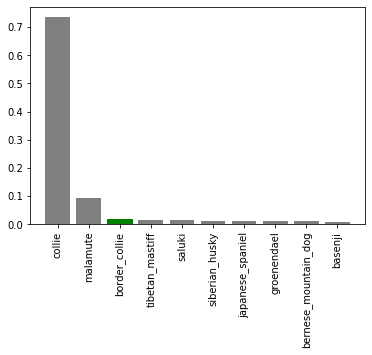

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

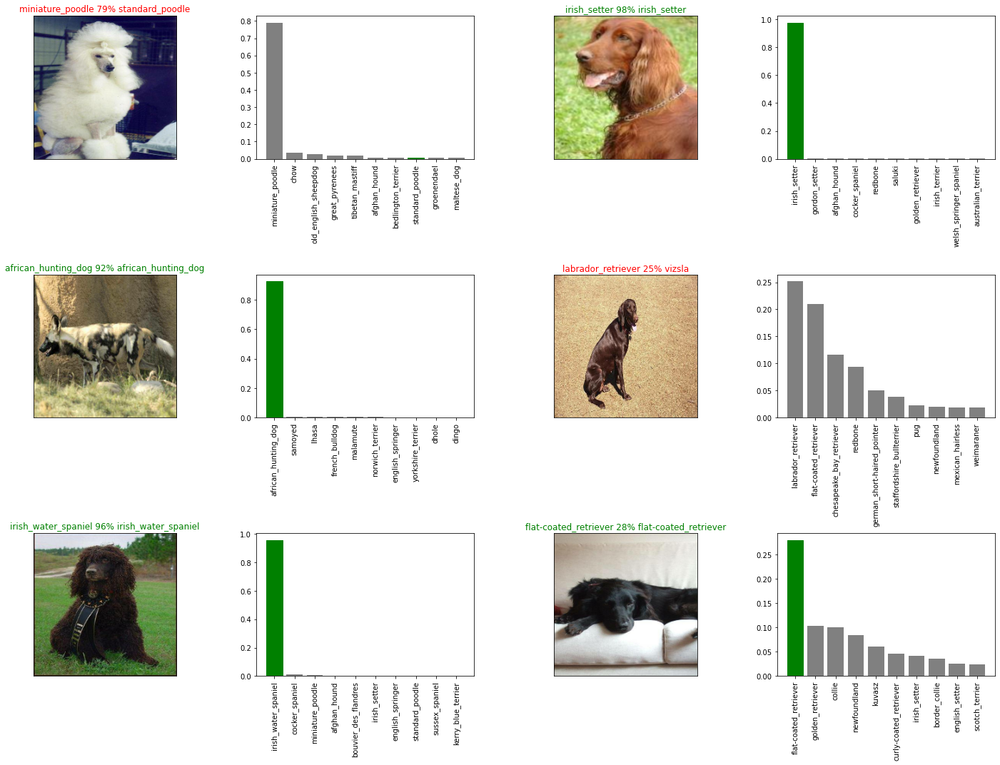

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 15
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
            labels=val_labels,
            n=i+i_multiplier)

plt.tight_layout(h_pad=1.0) 
plt.show()

## **Saving and reloading a trained model**

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Colab/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

**Save a model**

In [ ]:
save_model(model, suffix="1000-image")

Saving model to: drive/MyDrive/Colab/models/20201128-07491606549788-1000-image.h5...


'drive/MyDrive/Colab/models/20201128-07491606549788-1000-image.h5'

**Load the model**

In [ ]:
load_model_1000_image = load_model('drive/MyDrive/Colab/models/20201128-07491606549788-1000-image.h5')

Loading saved model from: drive/MyDrive/Colab/models/20201128-07491606549788-1000-image.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 98ms/step - loss: 1.3779 - accuracy: 0.6300


[1.377866506576538, 0.6299999952316284]

In [ ]:
# Evaluate the saved model
load_model_1000_image.evaluate(val_data)

7/7 [==============================] - 1s 116ms/step - loss: 1.3779 - accuracy: 0.6300


[1.377866506576538, 0.6299999952316284]

## Training  model on all data

In [ ]:
# createa data batch with the full data set
full_data = create_data_batches(X,y)

Creating training data batches..


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# create full model callabcks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data, so we can't montior validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note** Take longer time<br/>
As it has to load all of the images into memory

In [ ]:
# fit the full model to the full data
full_model.fit(x=full_data, 
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1916s 6s/step - loss: 1.3478 - accuracy: 0.6698
Epoch 2/100
320/320 [==============================] - 42s 130ms/step - loss: 0.4005 - accuracy: 0.8825
Epoch 3/100
320/320 [==============================] - 42s 130ms/step - loss: 0.2379 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1535 - accuracy: 0.9616
Epoch 5/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1061 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0762 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0566 - accuracy: 0.9937
Epoch 8/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0453 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0384 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 41s 129ms

In [ ]:
save_model(full_model, suffix="complete_model")

Saving model to: drive/MyDrive/Colab/models/20201128-08531606553628-complete_model.h5...


'drive/MyDrive/Colab/models/20201128-08531606553628-complete_model.h5'

In [ ]:
# load the ful_model
loaded_full_model = load_model('drive/MyDrive/Colab/models/20201128-08531606553628-complete_model.h5')

Loading saved model from: drive/MyDrive/Colab/models/20201128-08531606553628-complete_model.h5


## Prediction on the test dataset

To make predictions:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Colab/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:5]

['drive/MyDrive/Colab/test/df9ee3c663b1f2ca84781c09fa8c31f8.jpg',
 'drive/MyDrive/Colab/test/e2915c191c0bc761b795b78f66845fe0.jpg',
 'drive/MyDrive/Colab/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 'drive/MyDrive/Colab/test/e0295b9b1bee725d52d74f9af84092cf.jpg',
 'drive/MyDrive/Colab/test/e71d9f32ea6eb1c2d944e8f4e811c209.jpg']

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)
test_data

creating test data batches..


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note** Calling `predict()` on full model and passing test data batch will take a long time to run 

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 2247s 7s/step


In [ ]:
# Save prediction (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Colab/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Colab/preds_array..csv", delimiter=",")

In [ ]:
test_predictions[:5]

array([[2.25120563e-15, 4.07536723e-14, 1.07449883e-13, 5.52637431e-14,
        1.78297877e-14, 3.33317693e-15, 1.50195442e-14, 7.12717971e-13,
        8.52641661e-15, 2.95796048e-13, 4.68779850e-16, 1.87674570e-15,
        2.08735129e-13, 2.81412641e-16, 4.65298427e-13, 7.90919793e-13,
        4.84044686e-15, 6.81058031e-12, 2.06149388e-14, 3.10624776e-10,
        3.49888914e-14, 3.54857311e-12, 6.59886659e-11, 3.68989829e-15,
        3.31078476e-15, 7.44970752e-11, 1.93607266e-11, 2.62174699e-10,
        5.62696851e-12, 1.38520750e-10, 6.96338269e-16, 2.96423991e-14,
        8.96948175e-16, 6.51555307e-13, 3.96001244e-15, 7.39620964e-17,
        2.13292318e-12, 3.02894487e-09, 2.37721106e-12, 1.62192037e-13,
        3.27115045e-16, 1.58299076e-15, 4.96446773e-15, 1.30490091e-10,
        2.09954639e-16, 4.61978539e-10, 2.23967476e-07, 2.85862669e-13,
        2.43046872e-15, 6.65949771e-14, 7.13034114e-15, 4.34325458e-11,
        6.57983748e-15, 1.86786350e-12, 7.64930203e-11, 2.952568

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

**Data format:** https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed. 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df9ee3c663b1f2ca84781c09fa8c31f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2915c191c0bc761b795b78f66845fe0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7afcce6e45858fc3b294cc5c0b15a53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e0295b9b1bee725d52d74f9af84092cf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e71d9f32ea6eb1c2d944e8f4e811c209,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df9ee3c663b1f2ca84781c09fa8c31f8,2.25121e-15,4.07537e-14,1.0745e-13,5.52637e-14,1.78298e-14,3.33318e-15,1.50195e-14,7.12718e-13,8.52642e-15,2.95796e-13,4.6878e-16,1.87675e-15,2.08735e-13,2.81413e-16,4.65298e-13,7.9092e-13,4.84045e-15,6.81058e-12,2.06149e-14,3.10625e-10,3.49889e-14,3.54857e-12,6.59887e-11,3.6899e-15,3.31078e-15,7.44971e-11,1.93607e-11,2.62175e-10,5.62697e-12,1.38521e-10,6.96338e-16,2.96424e-14,8.96948e-16,6.51555e-13,3.96001e-15,7.39621e-17,2.13292e-12,3.02894e-09,2.37721e-12,...,2.61755e-10,4.4667e-13,6.75916e-18,1.52593e-17,1.14479e-11,1.85132e-13,8.18049e-16,7.89578e-13,9.60975e-12,2.92957e-10,9.107e-12,3.14382e-15,2.1789e-13,2.72799e-13,9.81275e-14,5.22241e-13,3.44427e-15,5.75203e-15,7.25352e-15,2.82623e-13,2.41385e-14,1.0507e-12,2.35901e-12,1.05725e-13,5.86018e-11,9.6088e-13,1.13548e-13,6.73489e-14,1.4042e-17,2.51857e-13,1.31704e-15,4.80097e-10,1.53794e-14,4.02168e-15,1.39631e-15,1.1405e-16,6.16038e-15,1.07861e-10,8.47065e-13,6.53384e-15
1,e2915c191c0bc761b795b78f66845fe0,6.36876e-09,7.91089e-06,2.6558e-08,2.09317e-07,7.74762e-10,1.06817e-06,3.7079e-09,4.05828e-08,1.37939e-08,4.79651e-10,0.996876,7.83085e-07,4.87211e-07,4.47182e-08,2.6304e-08,8.46279e-07,2.96025e-07,1.84062e-06,2.7282e-07,3.05327e-07,3.53016e-09,1.90681e-08,4.66606e-09,2.86352e-06,1.38392e-08,3.15992e-07,3.28676e-08,4.5636e-09,6.59179e-07,5.25071e-08,2.29581e-08,1.35493e-07,5.87434e-08,1.0957e-06,7.57583e-06,2.95813e-07,2.59076e-08,1.16942e-08,7.35053e-08,...,4.15336e-07,2.4164e-08,3.09675e-05,1.90298e-06,6.51687e-08,2.96657e-08,8.65077e-09,3.41176e-09,6.85485e-08,1.93703e-07,5.13475e-08,7.50205e-10,3.47806e-08,9.85521e-06,1.12536e-07,4.97621e-09,2.75654e-09,0.000122685,1.19656e-06,1.77256e-08,8.43082e-08,1.73057e-08,1.39731e-08,3.83463e-07,3.0849e-07,2.96484e-05,6.34194e-06,4.91246e-07,6.268e-08,1.59451e-07,0.000257401,7.39193e-08,1.15336e-07,1.25384e-06,2.75919e-07,5.85895e-08,7.15793e-08,7.68783e-05,4.84332e-05,1.0396e-07
2,e7afcce6e45858fc3b294cc5c0b15a53,0.133799,7.19145e-08,1.9669e-09,2.8198e-10,9.13979e-10,5.57626e-12,8.16247e-07,1.13282e-11,2.25624e-12,4.24078e-13,1.66157e-09,1.14969e-05,9.29967e-10,4.05005e-09,9.12071e-12,1.42872e-12,1.05016e-08,5.12068e-10,1.94984e-09,7.83373e-11,0.802907,1.42147e-11,7.37427e-06,0.000650587,1.92129e-11,3.81581e-10,0.0622522,6.57601e-09,4.69406e-11,2.14317e-10,1.36661e-09,3.24808e-09,1.0002e-10,4.06822e-07,1.26053e-11,1.24371e-09,8.51635e-12,8.17025e-11,9.88621e-11,...,6.75919e-12,6.56473e-07,7.63907e-10,2.89367e-06,4.96707e-09,1.42231e-08,1.1139e-11,0.000226355,1.13477e-08,5.97585e-10,3.33348e-10,6.05288e-12,3.61978e-12,7.95328e-13,1.58068e-07,1.06326e-05,3.35701e-09,6.48299e-06,2.19793e-10,3.1134e-10,3.48894e-07,2.88771e-08,5.67382e-08,5.08839e-07,4.28076e-08,7.88978e-11,6.23152e-08,1.74613e-07,1.1877e-10,4.49721e-07,4.03873e-07,5.53044e-09,3.40217e-08,2.86602e-09,1.37759e-09,8.9494e-13,7.67758e-12,4.28677

**Saving dataframe**

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Colab/full_model_predictions_submission.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
*Compare the predicted labels to the custom images.

In [ ]:
custom_predict_model = load_model('drive/MyDrive/Colab/models/20201128-08531606553628-complete_model.h5')

Loading saved model from: drive/MyDrive/Colab/models/20201128-08531606553628-complete_model.h5


**function**

In [ ]:
def name_image(dog_image):
  listo = []
  listo.append(dog_image)
  custom_data = create_data_batches(listo, test_data=True)
  custom_pred_label = get_pred_label(custom_predict)
  return (custom_pred_label)



creating test data batches..
Dog Breed: staffordshire_bullterrier


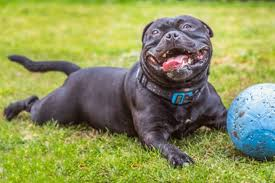

In [ ]:
dog = "drive/MyDrive/Colab/download1.jpg"

print(f"Dog Breed: {name_image(dog)}")
Image("drive/MyDrive/Colab/download1.jpg")